# Lab 1:
#Базові алгоритми класифікації з використанням бібліотеки Scikit-learn


Виконала: Балацька Вікторія ФІ-52мн

In [79]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

**Завантаження датасету**

Датасет: https://www.kaggle.com/datasets/aravindpcoder/obesity-or-cvd-risk-classifyregressorcluster

Дані складаються з оцінки рівня ожиріння у людей з Мексики, Перу та Колумбії віком від 14 до 61 року з різними харчовими звичками та фізичною формою.

**Завантаження датасету**

In [116]:
data_frame = pd.read_csv("ObesityDataSet.csv")
data_frame

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21.000000,1.620000,64.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,0.000000,1.000000,no,Public_Transportation,Normal_Weight
1,Female,21.000000,1.520000,56.000000,yes,no,3.0,3.0,Sometimes,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.000000,1.800000,77.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,2.000000,1.000000,Frequently,Public_Transportation,Normal_Weight
3,Male,27.000000,1.800000,87.000000,no,no,3.0,3.0,Sometimes,no,2.000000,no,2.000000,0.000000,Frequently,Walking,Overweight_Level_I
4,Male,22.000000,1.780000,89.800000,no,no,2.0,1.0,Sometimes,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,Sometimes,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesity_Type_III
2107,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,Sometimes,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesity_Type_III
2108,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,Sometimes,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesity_Type_III
2109,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,Sometimes,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesity_Type_III


**Змінення назв колонок (для зручності)**

In [117]:
rename_map = {
    "family_history_with_overweight": "FAM_OW",
    "NObeyesdad": "Obes_level"
}
data_frame = data_frame.rename(columns=rename_map)

TARGET_VAR = "Obes_level"
OTHER_FEATURES = [col for col in data_frame.columns if col != TARGET_VAR]

data_frame

,Gender,Age,Height,Weight,FAM_OW,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,Obes_level
0,Female,21.000000,1.620000,64.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,0.000000,1.000000,no,Public_Transportation,Normal_Weight
1,Female,21.000000,1.520000,56.000000,yes,no,3.0,3.0,Sometimes,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.000000,1.800000,77.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,2.000000,1.000000,Frequently,Public_Transportation,Normal_Weight
3,Male,27.000000,1.800000,87.000000,no,no,3.0,3.0,Sometimes,no,2.000000,no,2.000000,0.000000,Frequently,Walking,Overweight_Level_I
4,Male,22.000000,1.780000,89.800000,no,no,2.0,1.0,Sometimes,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,Sometimes,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesity_Type_III
2107,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,Sometimes,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesity_Type_III
2108,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,Sometimes,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesity_Type_III
2109,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,Sometimes,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesity_Type_III


**Загальний розмір датасету**

In [118]:
shape = data_frame.shape
print(shape)

(2111, 17)


Як можна побачити, датасет включає в себе 2111 записів та 17 аотрибутів

**Назви колонок**

In [119]:
info = data_frame.info()
print(info)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Gender      2111 non-null   object 
 1   Age         2111 non-null   float64
 2   Height      2111 non-null   float64
 3   Weight      2111 non-null   float64
 4   FAM_OW      2111 non-null   object 
 5   FAVC        2111 non-null   object 
 6   FCVC        2111 non-null   float64
 7   NCP         2111 non-null   float64
 8   CAEC        2111 non-null   object 
 9   SMOKE       2111 non-null   object 
 10  CH2O        2111 non-null   float64
 11  SCC         2111 non-null   object 
 12  FAF         2111 non-null   float64
 13  TUE         2111 non-null   float64
 14  CALC        2111 non-null   object 
 15  MTRANS      2111 non-null   object 
 16  Obes_level  2111 non-null   object 
dtypes: float64(8), object(9)
memory usage: 280.5+ KB
None


Колонки (атрибути) включають в себе:
- Gender: стать особи (чол/жін)
- Age: вік особи (14-61)
- Height: зріст особи
- Weight: вага особи
- FAM_OW: чи хтось із сімʼї страждав на ожиріння (так/ні)
- FAVC: часте вживання висококалорійної їжі (так/ні)
- FACVC:часте вживання овочів в раціоні (1-3)
- NCP: кількість основних прийомів їжі (1-4)
- CAEC: частота перекурсів (часто/завжди/іноді/ні)
- SMOKE: чи є особа курцем (так/ні)
- CH20:добове вживання води (1-3)
- SCC: чи відслідковує особа кількість калоріїв в їжі (так/ні)
- FAF: частота фізичної активності (0-3)
- TUE: час використання "технологічних" пристроїм (0-2)
- CALC: частота вживання алкоголю (завжди/часто/іноді/ні)
- MTRANS: основний спосіб пересування (пішки/велосипед/громадський транспорт/мотоцикл/автомобіль)
- Obes_level: визначений рівень ожиріння (або його відсутність)

**Перевірка на пропуски**

In [120]:
null = data_frame.isnull().any().any()
print(null)

False


**Зведення даних до неперервних чи числових**

Для підрахунку матриці кореляцій, графіків, а також для побудови класифікаторів доречно перевести категоріальні дані в числові.

Для цієї задачі можна було використати encoder. Але, так як мені необхідно було мати більший контроль над "відстанню" між різними значеннями критерію в деяких випадках, я задам градацію вручну.

**Спосіб пересування**:

In [121]:
MTRANS = set(data_frame['MTRANS'])
print(MTRANS)


{'Bike', 'Motorbike', 'Walking', 'Automobile', 'Public_Transportation'}



Перетворимо його в залежності від зменшення ступеня рухливості:



*   Ходьба - 0.0
*   Велосипед - 0.1
*   Громадський транспорт - 0.4
*   Мотоцикл - 0.6
*   Автомобіль - 1







In [122]:
mobility_map = {
    'Walking': 0.0,
    'Bike': 0.1,
    'Public_Transportation': 0.4,
    'Motorbike': 0.6,
    'Automobile': 1.0
}
data_frame["MTRANS"] = data_frame["MTRANS"].map(mobility_map)

data_frame

,Gender,Age,Height,Weight,FAM_OW,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,Obes_level
0,Female,21.000000,1.620000,64.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,0.000000,1.000000,no,0.4,Normal_Weight
1,Female,21.000000,1.520000,56.000000,yes,no,3.0,3.0,Sometimes,yes,3.000000,yes,3.000000,0.000000,Sometimes,0.4,Normal_Weight
2,Male,23.000000,1.800000,77.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,2.000000,1.000000,Frequently,0.4,Normal_Weight
3,Male,27.000000,1.800000,87.000000,no,no,3.0,3.0,Sometimes,no,2.000000,no,2.000000,0.000000,Frequently,0.0,Overweight_Level_I
4,Male,22.000000,1.780000,89.800000,no,no,2.0,1.0,Sometimes,no,2.000000,no,0.000000,0.000000,Sometimes,0.4,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,Sometimes,no,1.728139,no,1.676269,0.906247,Sometimes,0.4,Obesity_Type_III
2107,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,Sometimes,no,2.005130,no,1.341390,0.599270,Sometimes,0.4,Obesity_Type_III
2108,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,Sometimes,no,2.054193,no,1.414209,0.646288,Sometimes,0.4,Obesity_Type_III
2109,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,Sometimes,no,2.852339,no,1.139107,0.586035,Sometimes,0.4,Obesity_Type_III


**Частота перекурсів та вживання алкоголю**

In [123]:
CAEC = set(data_frame['CAEC'])
print(CAEC)

{'Always', 'Frequently', 'no', 'Sometimes'}


In [124]:
CALC = set(data_frame['CALC'])
print(CALC)

{'Always', 'Frequently', 'no', 'Sometimes'}


Перетворимо його в залежності від частоти:



*   Always - 1.0
*   Frequently - 0.66
*   Sometimes - 0.33
*   No - 0.0



In [125]:
mobility_map = {
    'Always': 1.0,
    'Frequently': 0.66,
    'no': 0.0,
    'Sometimes': 0.33
}
data_frame['CAEC'] = data_frame['CAEC'].map(mobility_map)
data_frame['CALC'] = data_frame['CALC'].map(mobility_map)

data_frame

,Gender,Age,Height,Weight,FAM_OW,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,Obes_level
0,Female,21.000000,1.620000,64.000000,yes,no,2.0,3.0,0.33,no,2.000000,no,0.000000,1.000000,0.00,0.4,Normal_Weight
1,Female,21.000000,1.520000,56.000000,yes,no,3.0,3.0,0.33,yes,3.000000,yes,3.000000,0.000000,0.33,0.4,Normal_Weight
2,Male,23.000000,1.800000,77.000000,yes,no,2.0,3.0,0.33,no,2.000000,no,2.000000,1.000000,0.66,0.4,Normal_Weight
3,Male,27.000000,1.800000,87.000000,no,no,3.0,3.0,0.33,no,2.000000,no,2.000000,0.000000,0.66,0.0,Overweight_Level_I
4,Male,22.000000,1.780000,89.800000,no,no,2.0,1.0,0.33,no,2.000000,no,0.000000,0.000000,0.33,0.4,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,0.33,no,1.728139,no,1.676269,0.906247,0.33,0.4,Obesity_Type_III
2107,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,0.33,no,2.005130,no,1.341390,0.599270,0.33,0.4,Obesity_Type_III
2108,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,0.33,no,2.054193,no,1.414209,0.646288,0.33,0.4,Obesity_Type_III
2109,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,0.33,no,2.852339,no,1.139107,0.586035,0.33,0.4,Obesity_Type_III


**Чи хтось в сімʼї страждав на ожиріння, часте вживання висококалорійної їжі, чи відслідковується кількість калоріїв в їжі, чи є особа курцем, стать (чоловіча/жіноча)**

In [126]:
Gender = set(data_frame['Gender'])
print(Gender)

{'Female', 'Male'}


In [127]:
FAM_OW = set(data_frame['FAM_OW'])
print(FAM_OW)

{'yes', 'no'}


In [128]:
FAVC = set(data_frame['FAVC'])
print(FAVC)

{'yes', 'no'}


In [129]:
SCC = set(data_frame['SCC'])
print(SCC)

{'yes', 'no'}


In [130]:
SMOKE = set(data_frame['SMOKE'])
print(SMOKE)

{'yes', 'no'}


Замінимо:

*  Так/Жін - 1.0
*  Ні/Чол - 0.0



In [131]:
mobility_map = {
    'yes': 1.0,
    'no': 0.0
}

gender_map = {
    'Female': 1.0,
    'Male': 0.0
}

data_frame['FAM_OW'] = data_frame['FAM_OW'].map(mobility_map)
data_frame['FAVC'] = data_frame['FAVC'].map(mobility_map)
data_frame['SCC'] = data_frame['SCC'].map(mobility_map)
data_frame['SMOKE'] = data_frame['SMOKE'].map(mobility_map)
data_frame['Gender'] = data_frame['Gender'].map(gender_map)

data_frame

,Gender,Age,Height,Weight,FAM_OW,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,Obes_level
0,1.0,21.000000,1.620000,64.000000,1.0,0.0,2.0,3.0,0.33,0.0,2.000000,0.0,0.000000,1.000000,0.00,0.4,Normal_Weight
1,1.0,21.000000,1.520000,56.000000,1.0,0.0,3.0,3.0,0.33,1.0,3.000000,1.0,3.000000,0.000000,0.33,0.4,Normal_Weight
2,0.0,23.000000,1.800000,77.000000,1.0,0.0,2.0,3.0,0.33,0.0,2.000000,0.0,2.000000,1.000000,0.66,0.4,Normal_Weight
3,0.0,27.000000,1.800000,87.000000,0.0,0.0,3.0,3.0,0.33,0.0,2.000000,0.0,2.000000,0.000000,0.66,0.0,Overweight_Level_I
4,0.0,22.000000,1.780000,89.800000,0.0,0.0,2.0,1.0,0.33,0.0,2.000000,0.0,0.000000,0.000000,0.33,0.4,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,1.0,20.976842,1.710730,131.408528,1.0,1.0,3.0,3.0,0.33,0.0,1.728139,0.0,1.676269,0.906247,0.33,0.4,Obesity_Type_III
2107,1.0,21.982942,1.748584,133.742943,1.0,1.0,3.0,3.0,0.33,0.0,2.005130,0.0,1.341390,0.599270,0.33,0.4,Obesity_Type_III
2108,1.0,22.524036,1.752206,133.689352,1.0,1.0,3.0,3.0,0.33,0.0,2.054193,0.0,1.414209,0.646288,0.33,0.4,Obesity_Type_III
2109,1.0,24.361936,1.739450,133.346641,1.0,1.0,3.0,3.0,0.33,0.0,2.852339,0.0,1.139107,0.586035,0.33,0.4,Obesity_Type_III


**Рівень ожиріння (або його відсутність)**

In [132]:
Obes_level = set(data_frame['Obes_level'])
print(Obes_level)

{'Insufficient_Weight', 'Obesity_Type_I', 'Obesity_Type_III', 'Normal_Weight', 'Overweight_Level_I', 'Obesity_Type_II', 'Overweight_Level_II'}


Пронумеруємо їх у порядку збільшення ступеня:


*   Insufficient_Weight - 0
*   Normal_Weight - 1
*   Overweight_Level_I - 2
*   Overweight_Level_II - 3
*   Obesity_Type_I - 4
*   Obesity_Type_II - 5
*   Obesity_Type_III - 6




In [133]:
mobility_map = {
    'Insufficient_Weight': 0,
    'Normal_Weight': 1,
    'Overweight_Level_I': 2,
    'Overweight_Level_II': 3,
    'Obesity_Type_I': 4,
    'Obesity_Type_II': 5,
    'Obesity_Type_III': 6
}

data_frame['Obes_level'] = data_frame['Obes_level'].map(mobility_map)

data_frame

,Gender,Age,Height,Weight,FAM_OW,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,Obes_level
0,1.0,21.000000,1.620000,64.000000,1.0,0.0,2.0,3.0,0.33,0.0,2.000000,0.0,0.000000,1.000000,0.00,0.4,1
1,1.0,21.000000,1.520000,56.000000,1.0,0.0,3.0,3.0,0.33,1.0,3.000000,1.0,3.000000,0.000000,0.33,0.4,1
2,0.0,23.000000,1.800000,77.000000,1.0,0.0,2.0,3.0,0.33,0.0,2.000000,0.0,2.000000,1.000000,0.66,0.4,1
3,0.0,27.000000,1.800000,87.000000,0.0,0.0,3.0,3.0,0.33,0.0,2.000000,0.0,2.000000,0.000000,0.66,0.0,2
4,0.0,22.000000,1.780000,89.800000,0.0,0.0,2.0,1.0,0.33,0.0,2.000000,0.0,0.000000,0.000000,0.33,0.4,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,1.0,20.976842,1.710730,131.408528,1.0,1.0,3.0,3.0,0.33,0.0,1.728139,0.0,1.676269,0.906247,0.33,0.4,6
2107,1.0,21.982942,1.748584,133.742943,1.0,1.0,3.0,3.0,0.33,0.0,2.005130,0.0,1.341390,0.599270,0.33,0.4,6
2108,1.0,22.524036,1.752206,133.689352,1.0,1.0,3.0,3.0,0.33,0.0,2.054193,0.0,1.414209,0.646288,0.33,0.4,6
2109,1.0,24.361936,1.739450,133.346641,1.0,1.0,3.0,3.0,0.33,0.0,2.852339,0.0,1.139107,0.586035,0.33,0.4,6


**Вигляд датасету після перетворень**

In [134]:
data_frame

,Gender,Age,Height,Weight,FAM_OW,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,Obes_level
0,1.0,21.000000,1.620000,64.000000,1.0,0.0,2.0,3.0,0.33,0.0,2.000000,0.0,0.000000,1.000000,0.00,0.4,1
1,1.0,21.000000,1.520000,56.000000,1.0,0.0,3.0,3.0,0.33,1.0,3.000000,1.0,3.000000,0.000000,0.33,0.4,1
2,0.0,23.000000,1.800000,77.000000,1.0,0.0,2.0,3.0,0.33,0.0,2.000000,0.0,2.000000,1.000000,0.66,0.4,1
3,0.0,27.000000,1.800000,87.000000,0.0,0.0,3.0,3.0,0.33,0.0,2.000000,0.0,2.000000,0.000000,0.66,0.0,2
4,0.0,22.000000,1.780000,89.800000,0.0,0.0,2.0,1.0,0.33,0.0,2.000000,0.0,0.000000,0.000000,0.33,0.4,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,1.0,20.976842,1.710730,131.408528,1.0,1.0,3.0,3.0,0.33,0.0,1.728139,0.0,1.676269,0.906247,0.33,0.4,6
2107,1.0,21.982942,1.748584,133.742943,1.0,1.0,3.0,3.0,0.33,0.0,2.005130,0.0,1.341390,0.599270,0.33,0.4,6
2108,1.0,22.524036,1.752206,133.689352,1.0,1.0,3.0,3.0,0.33,0.0,2.054193,0.0,1.414209,0.646288,0.33,0.4,6
2109,1.0,24.361936,1.739450,133.346641,1.0,1.0,3.0,3.0,0.33,0.0,2.852339,0.0,1.139107,0.586035,0.33,0.4,6


In [135]:
info = data_frame.info()
print(info)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Gender      2111 non-null   float64
 1   Age         2111 non-null   float64
 2   Height      2111 non-null   float64
 3   Weight      2111 non-null   float64
 4   FAM_OW      2111 non-null   float64
 5   FAVC        2111 non-null   float64
 6   FCVC        2111 non-null   float64
 7   NCP         2111 non-null   float64
 8   CAEC        2111 non-null   float64
 9   SMOKE       2111 non-null   float64
 10  CH2O        2111 non-null   float64
 11  SCC         2111 non-null   float64
 12  FAF         2111 non-null   float64
 13  TUE         2111 non-null   float64
 14  CALC        2111 non-null   float64
 15  MTRANS      2111 non-null   float64
 16  Obes_level  2111 non-null   int64  
dtypes: float64(16), int64(1)
memory usage: 280.5 KB
None


**Побудова Heatmap для кореляції та інших графіків**

In [136]:
import seaborn as sns

**Матриця кореляції**

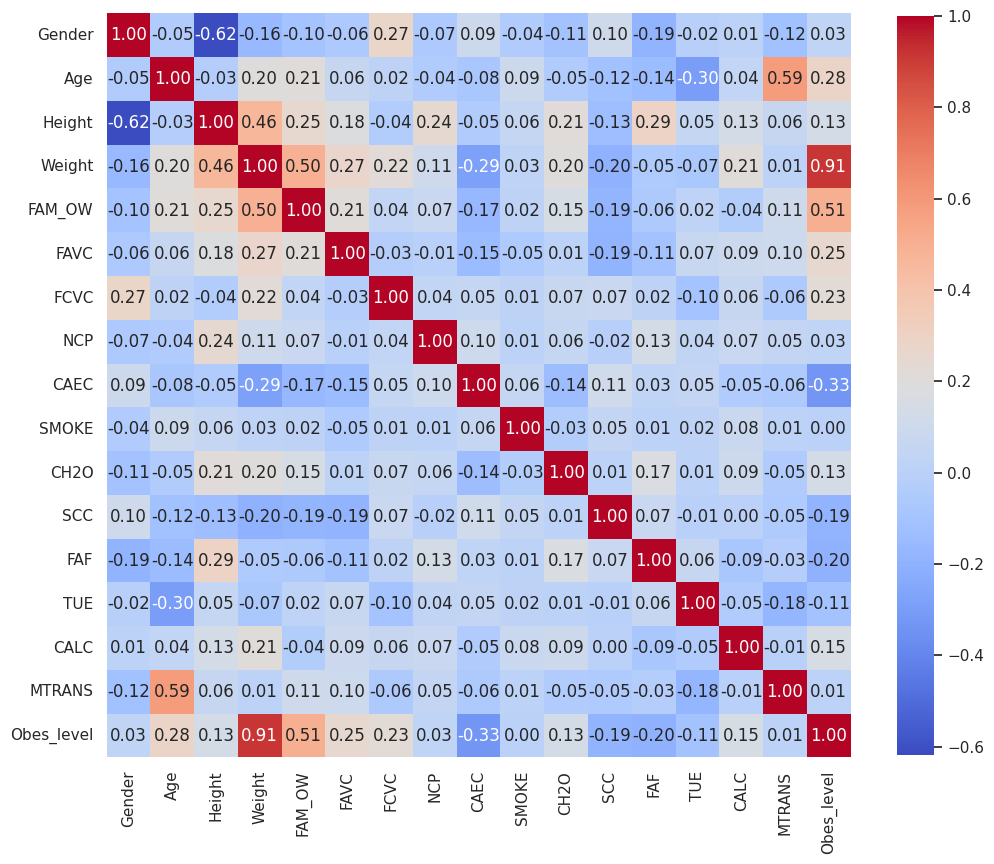

In [147]:
corr_matrix = data_frame.corr(numeric_only=True)

ax = sns.heatmap(
    corr_matrix,
    annot=True,
    cmap="coolwarm",
    fmt=".2f",
    square=True,
    cbar_kws={"shrink": 0.8}
)
ax.figure.set_size_inches(12, 12)
plt.show()


Як можна побачити на матриця кореляції:

- Діагональ - 1.00: Усі змінні ідеально корелюють самі з собою (тому тут завжди 1).
- Вага (Weight) та зріст (Height) - 0.46: Є середній позитивний зв’язок — вищі люди частіше важать більше.
- Вага (Weight) та Рівень ожиріння (Obes_level) - 0.91: Дуже сильний прямий зв’язок. Очевидно: більша вага → вищий рівень ожиріння.
- Сімейна історія ожиріння (FAM_OW) та рівень ожиріння (Obes_level) - 0.51: Середній прямий зв’язок. Тобто якщо у сім’ї є ожиріння, у людини теж вищий ризик.
- Вік (Age) та спосіб пересування (MTRANS) - 0.59: Сильний звʼязок. Чим старше людина, тим менш рухливий спосіб пересування вона обирає
- Частота перекусів CAEC та рівень одиріння (Obes_level) - (–0.33): Негативний зв’язок: менша кількість перекусів може бути асоційована з нижчим рівнем ожиріння.
- Частота фізичної активності (FAF) та рівень ожиріння (Obes_level) - (–0.20): Чим більше фізичної активності, тим нижчий рівень ожиріння.

**BoxPlots**

За допомогою BoxPlot для кожної змінної можна переглянути розподіл значень цієї змінної для кожного з шести класів рівня ожиріння.

In [175]:
def plot_box(col_name, data_frame, target_var):
    plt.figure()
    sns.boxplot(x=target_var, y=col_name, data=data_frame)
    plt.title(f"{col_name} vs {target_var}")
    plt.show()



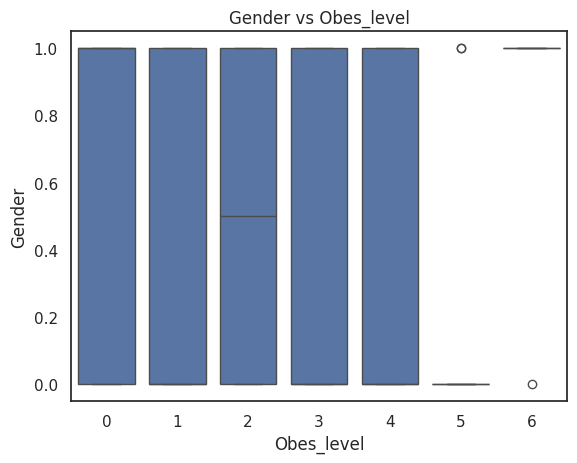

In [176]:
plot_box("Gender", data_frame, TARGET_VAR)

Gender vs Obes_level: Оскільки стать — бінарна змінна (0/1), boxplot виглядає як стовпці на рівнях 0 та 1. Це показує, що в усіх рівнях ожиріння представлені як чоловіки, так і жінки. Сам графік малоінформативний для аналізу, адже не відображає реального розподілу категорій, а лише підтверджує наявність обох статей у кожній групі.

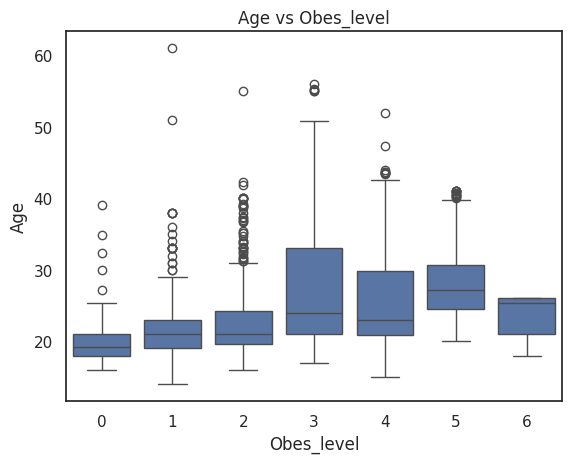

In [177]:
plot_box("Age", data_frame, TARGET_VAR)

Age vs Obes_level: Вік — числова змінна, тому boxplot тут інформативний. Ми бачимо, що на нижчих рівнях ожиріння (0–2) переважають молодші респонденти (медіана близько 20 років). На середніх і високих рівнях (3–5) віковий діапазон ширший, а медіана зростає до 25–30 років. Є поодинокі викиди у старшому віці (40–60 років), які з’являються в усіх групах. Це свідчить, що з віком ризик ожиріння може зростати, але розподіл дуже варіативний.

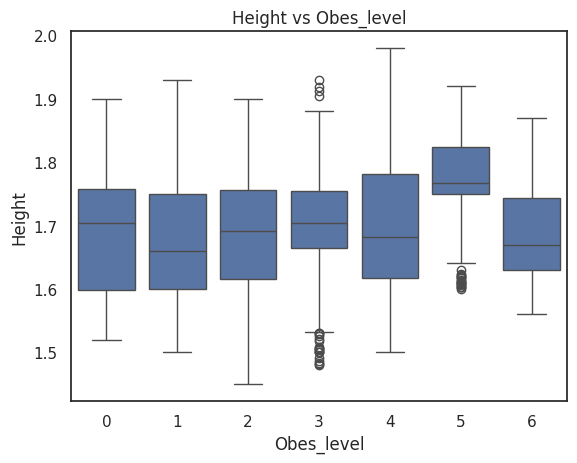

In [178]:
plot_box("Height", data_frame, TARGET_VAR)

HHeight vs Obes_level: Зріст — числова змінна, і boxplot показує його розподіл у різних класах ожиріння. Загалом медіани зросту залишаються відносно стабільними (приблизно 1.65–1.75 м) для всіх груп. У рівнях 5 і 6 видно дещо вищі медіани, а також ширший діапазон. Проте істотного зв’язку між зростом і рівнем ожиріння не простежується.

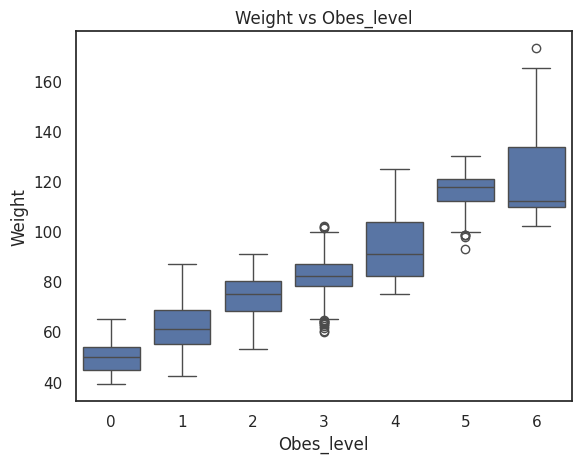

In [179]:
plot_box("Weight", data_frame, TARGET_VAR)

Weight vs Obes_level: Тут простежується чіткий і сильний зв’язок. Зі зростанням рівня ожиріння (Obes_level від 0 до 6) медіана ваги постійно зростає: від ~50 кг у групі 0 до понад 110 кг у групі 6. Також збільшується розкид (варіація) ваги в старших класах ожиріння. Вага напряму визначає рівень ожиріння — це очікувано, адже саме на основі ваги (разом із ростом через ІМТ) формується Obes_level.

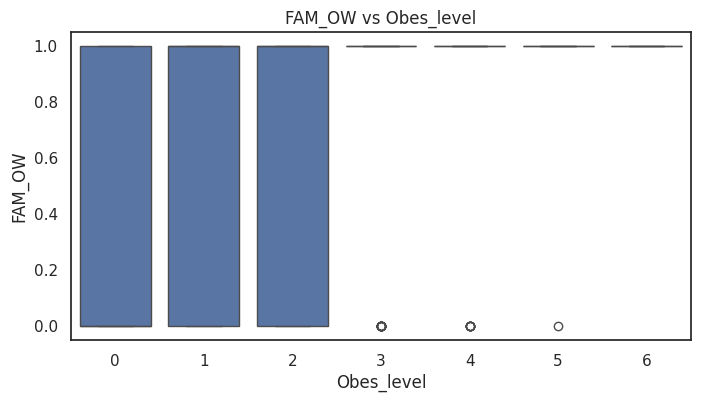

In [161]:
plot_box("FAM_OW", data_frame, TARGET_VAR)

FAM_OW vs Obes_level: FAM_OW — це наявність випадків ожиріння в родині (так/ні). На графіку видно, що для низьких рівнів ожиріння (0–2) майже всі значення дорівнюють 1 (тобто в родині були випадки ожиріння). Натомість для вищих рівнів (3–6) зустрічаються лише нулі або одиничні винятки. У вибірці ця ознака малоінформативна — фактично вона не розділяє групи ожиріння, а скоріше показує, що переважна більшість має сімейну історію ожиріння незалежно від Obes_level.

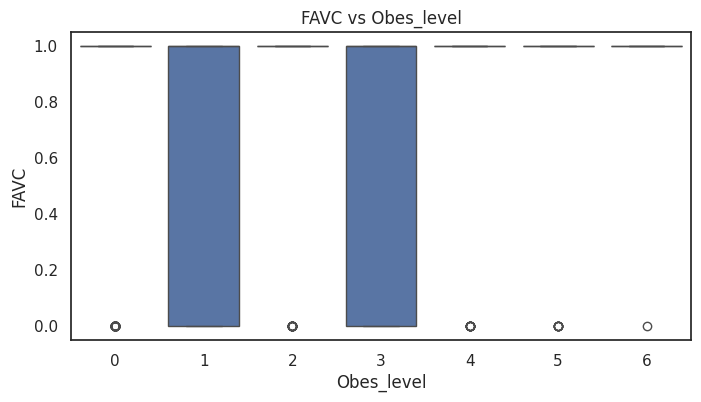

In [162]:
plot_box("FAVC", data_frame, TARGET_VAR)

FAVC vs Obes_level: У категоріях ожиріння 1–6 майже всі значення = 1 → більшість людей із зайвою вагою регулярно вживають висококалорійну їжу.
У категорії 0 (без ожиріння) більше нулів → помітна частина людей без зайвої ваги уникають такої їжі. Залежність чітка: споживання висококалорійної їжі суттєво пов’язане з підвищеним ризиком ожиріння.

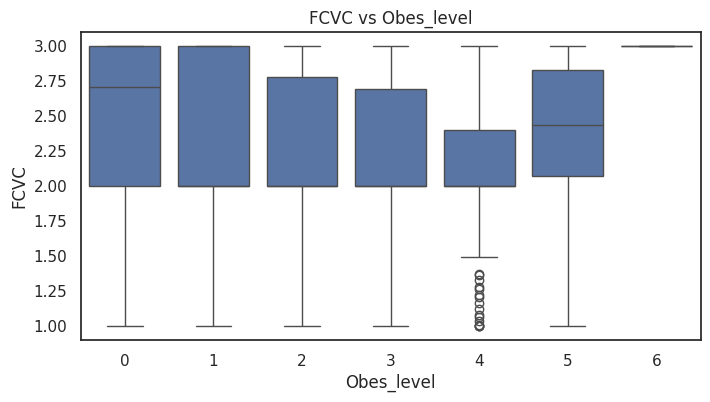

In [163]:
plot_box("FCVC", data_frame, TARGET_VAR)

FCVC vs Obes_level: У категорії 0 (без ожиріння) медіана споживання овочів знаходиться вище (≈2.7), а розподіл зміщений у бік високих значень → люди без зайвої ваги частіше вживають овочі. У середніх категоріях ожиріння (3–4) медіана нижча (≈2.0–2.3), а частина значень зосереджена ближче до мінімуму → такі люди їдять менше овочів. У високих категоріях ожиріння (5–6) спостерігається підйом медіани (≈2.5–3), але вибірка менша, тому ефект менш стабільний. Загалом, регулярне споживання овочів асоціюється з нижчим ризиком ожиріння, хоча зв’язок не ідеально лінійний.

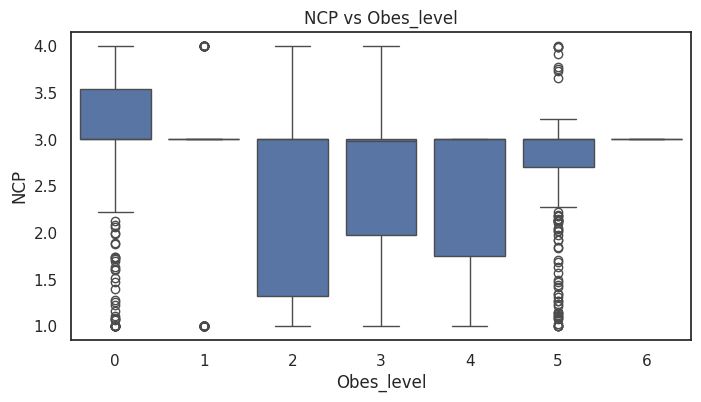

In [166]:
plot_box("NCP", data_frame, TARGET_VAR)

NCP vs Obes_level: У категорії 0 (без ожиріння) медіана кількості прийомів їжі вища (≈3–3.5), більшість людей харчуються регулярно 3–4 рази на день. У середніх категоріях ожиріння (2–4) медіана знижується до ≈2–3, а розкид значень більший → деякі люди мають лише 1–2 основних прийоми їжі, що свідчить про нерегулярність у харчуванні. У категорії 5 (високе ожиріння) також видно зміщення до 2–3 прийомів, причому є багато "викидів" із низькими значеннями.
Загальна тенденція: люди без ожиріння частіше дотримуються стабільного режиму харчування (3–4 рази на день), тоді як серед осіб із ожирінням більше нерегулярності, що може сприяти набору ваги.

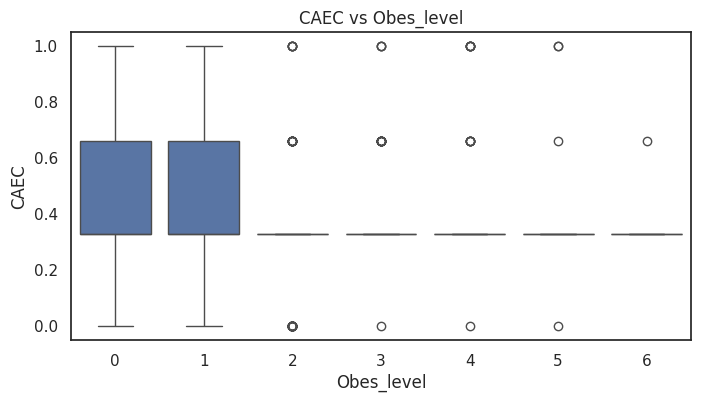

In [167]:
plot_box("CAEC", data_frame, TARGET_VAR)

CAEC vs Obes_level: У категоріях 0–1 (відсутність або низький рівень ожиріння) розподіл ширший: частина людей часто перекушує (значення ближче до 1), частина — рідше (≈0.3–0.5). У категоріях ожиріння 2–6 медіани майже на рівні 0.3 → більшість людей із зайвою вагою перекушують лише іноді або рідко. Цікаво, що перекуси частіше зустрічаються серед людей без ожиріння, тоді як у людей з високими рівнями ожиріння домінує помірна або низька частота перекусів. Це може свідчити, що головний фактор — не самі перекуси, а якість їжі (висококалорійність, об’єм порцій).

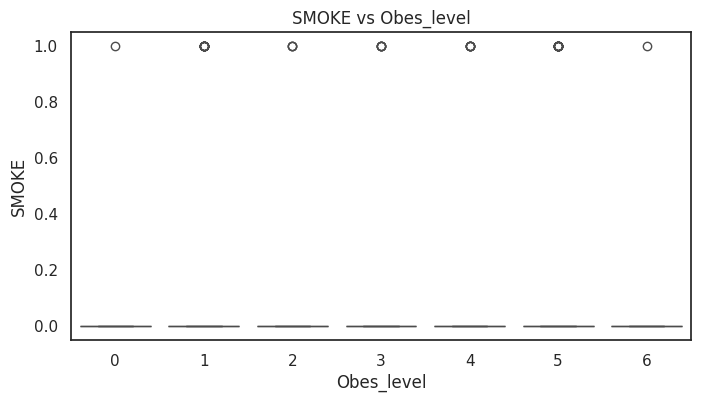

In [168]:
plot_box("SMOKE", data_frame, TARGET_VAR)

SMOKE vs Obes_level: У всіх категоріях ожиріння (0–6) більшість значень дорівнює 0 → тобто переважна частина людей не курить. Поодинокі одиниці трапляються у всіх класах, але вони дуже рідкісні → частка курців мінімальна й не пов’язана з конкретним рівнем ожиріння. Висновок: куріння не демонструє помітної залежності від ожиріння у цій вибірці, тож воно не є визначальним фактором для Obes_level.

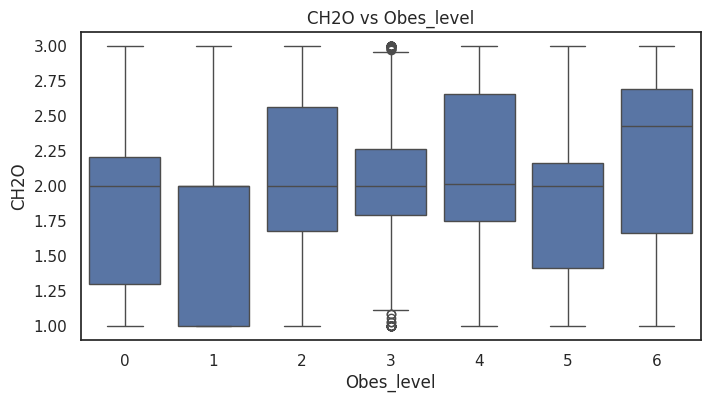

In [169]:
plot_box("CH2O", data_frame, TARGET_VAR)

CH2O vs Obes_level: У всіх групах ожиріння (0–6) медіана споживання води тримається близько 2 літрів. Розподіл доволі широкий: є як ті, хто п’є мало (≈1), так і ті, хто більше 2.5–3. У вищих рівнях ожиріння (4 і 6) є тенденція до більшого споживання (ящики зміщені вгору). Проте тренд не різкий: усі категорії мають суттєві перетини → чіткої залежності «більше води → менше/більше ожиріння» не видно. Висновок: споживання води відносно стабільне незалежно від Obes_level, але у найвищих рівнях ожиріння є схильність до більшого CH2O.

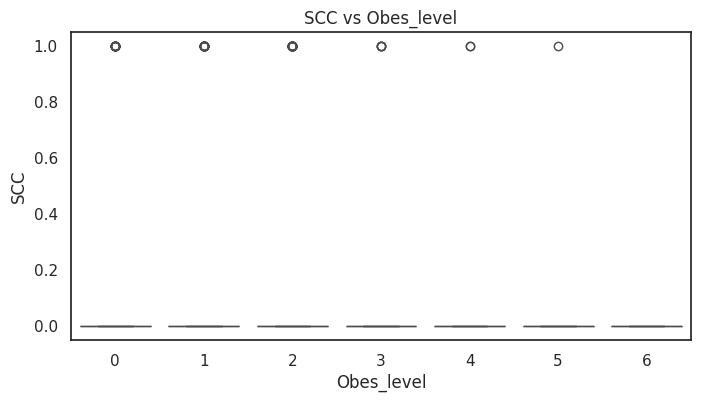

In [170]:
plot_box("SCC", data_frame, TARGET_VAR)

SCC vs Obes_level: Майже всі значення = 0 → більшість респондентів не контролюють калорії незалежно від рівня ожиріння. Дуже мала частка (окремі точки = 1) вказує, що деякі все ж контролюють калорії, але їх мало, і ця поведінка не залежить від Obes_level. Тобто незалежно від того, чи людина має нормальну вагу, чи високий рівень ожиріння, звичка рахувати калорії не поширена. Висновок: SCC не показує жодної чіткої кореляції з Obes_level, бо майже всюди спостерігається "0".

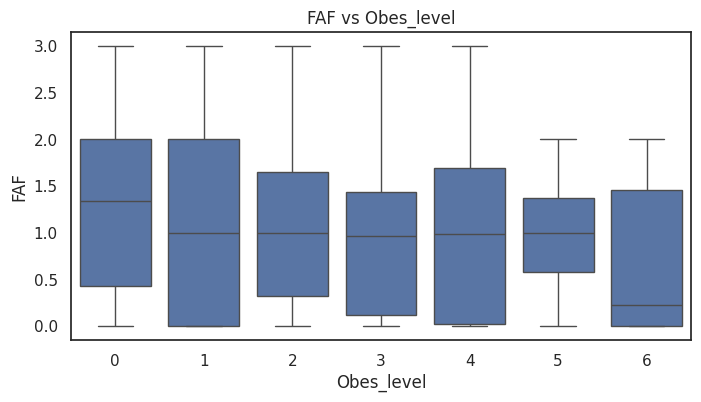

In [171]:
plot_box("FAF", data_frame, TARGET_VAR)

FAF vs Obes_level: Для категорії 0 (без ожиріння) медіана FAF 1.3–1.5 → ці люди займаються фізичною активністю трохи частіше. У категоріях 1–4 медіана знижується до 1.0 → фізична активність стає менш регулярною. Для більш високих рівнів ожиріння (5–6) медіана ще нижча (0–0.5), тобто більшість людей з важким ожирінням майже не займаються спортом. Загальна тенденція: чим вищий Obes_level, тим рідше люди займаються фізичною активністю. Фізична активність є суттєвим фактором у боротьбі з ожирінням: люди з нормальною вагою рухаються частіше, тоді як при зростанні рівня ожиріння активність помітно зменшується.

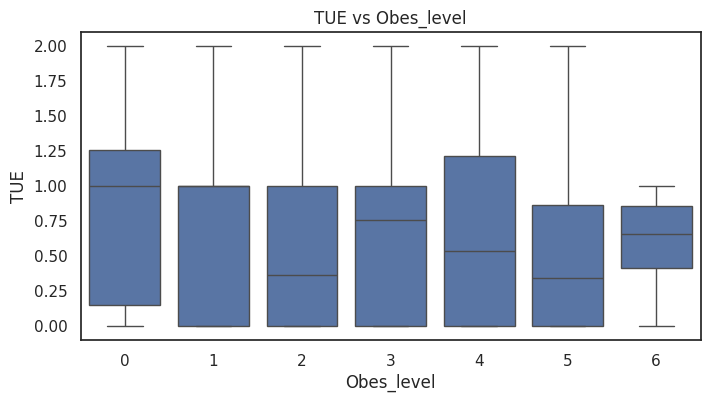

In [172]:
plot_box("TUE", data_frame, TARGET_VAR)

TUE vs Obes_level: Для категорії 0 (без ожиріння) медіана TUE ≈ 1.0, але розкид великий — є як низькі, так і високі значення. У категоріях 1–3 медіана нижча (0.3–0.7) → люди з початковими рівнями ожиріння проводять трохи менше часу за технологіями, ніж ті, хто не має ожиріння. У категорії 4 медіана піднімається до 0.5–0.6, а розкид знову великий. У важких рівнях ожиріння (5–6) медіана стабільно низька (0.3–0.6) і значення більш стиснуті. Залежність між використанням технологій (TUE) та рівнем ожиріння не є чіткою. Люди без ожиріння проводять більше часу за технологіями, ніж деякі групи з ожирінням.

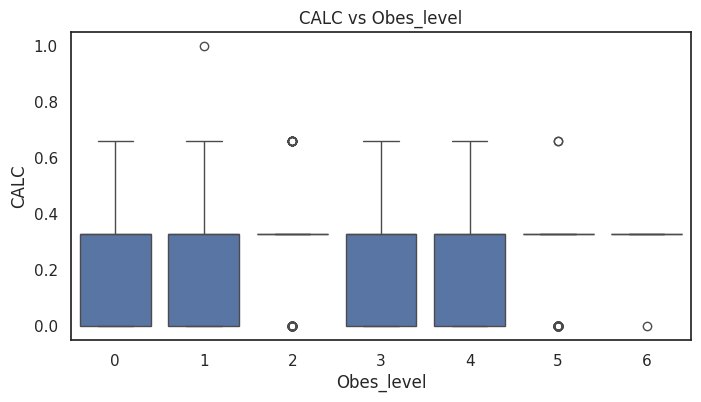

In [173]:
plot_box("CALC", data_frame, TARGET_VAR)

CALC vs Obes_level: Для всіх категорій 0–6 медіана близько 0.3 → більшість респондентів або зовсім не вживають алкоголь, або роблять це рідко. Розкид невеликий, але є поодинокі викиди (значення 1.0 — регулярне вживання).
Між рівнями ожиріння немає помітної різниці — алкоголь не демонструє сильної залежності з Obes_level. Споживання алкоголю (CALC) відносно стабільне серед усіх груп, незалежно від рівня ожиріння. Це означає, що алкоголь не є ключовим фактором у формуванні ожиріння в цій вибірці.

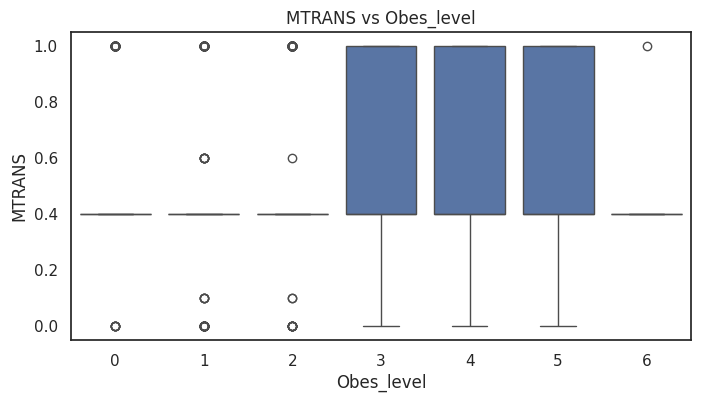

In [174]:
plot_box("MTRANS", data_frame, TARGET_VAR)

MTRANS vs Obes_level: Для рівнів ожиріння 3–5 значення MTRANS частіше високі (0.4–1.0) → ці групи більше користуються пасивним транспортом (машина, громадський транспорт). У категоріях 0–2 є більше нульових значень → частина людей без ожиріння більше ходять пішки чи використовують активніші види пересування. Для рівня 6 вибірка мала (лише одне значення, близьке до 0.4). Чим вищий рівень ожиріння, тим частіше люди користуються пасивним транспортом. Це логічно: низька фізична активність у пересуванні може сприяти набору ваги.

**PairPlot**

Аналогічний підхід, але розподіл класів по гістограмам для двох атрибутів.

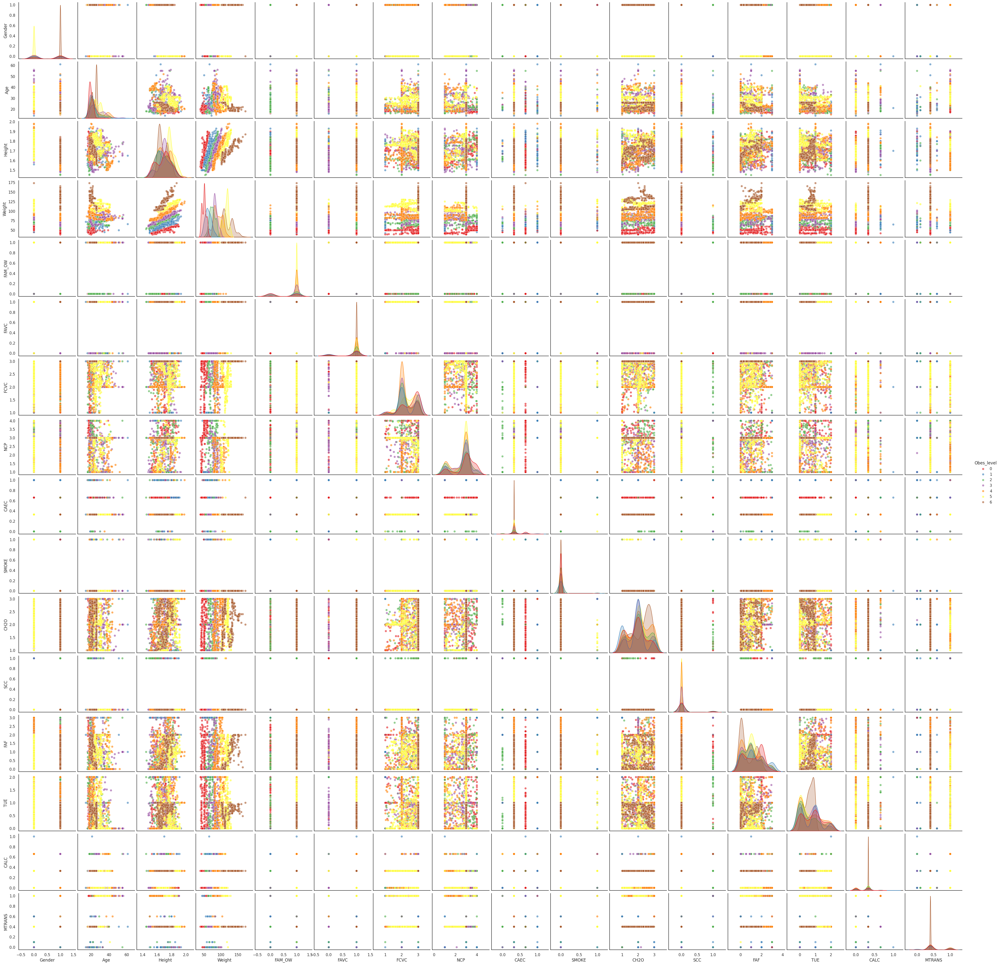

In [182]:
sns.pairplot(
    data_frame,
    hue=TARGET_VAR,
    palette="Set1",
    diag_kind="kde",
    plot_kws={"alpha": 0.6, "s": 40}
)

plt.show()

Дана матриця попарних діаграм відображає взаємозв’язки між усіма ознаками датасету. По діагоналі показані розподіли значень окремих змінних, а на решті клітинок – діаграми розсіювання для парних комбінацій. Завдяки кольоровому маркуванню за рівнями ожиріння можна простежити, які показники найбільше відрізняють різні групи. Зокрема, змінні «Height» та «Weight» демонструють найбільш чіткі відмінності між класами. Видно, що деякі ознаки мають кластеризацію залежно від рівня ожиріння, а бінарні змінні відображаються у вигляді дискретних смуг. Загалом діаграма підтверджує, що як окремі показники, так і їхні комбінації, мають суттєвий вплив на рівень ожиріння.

Приберемо бінарні значення (щоб виглядало красивіше)

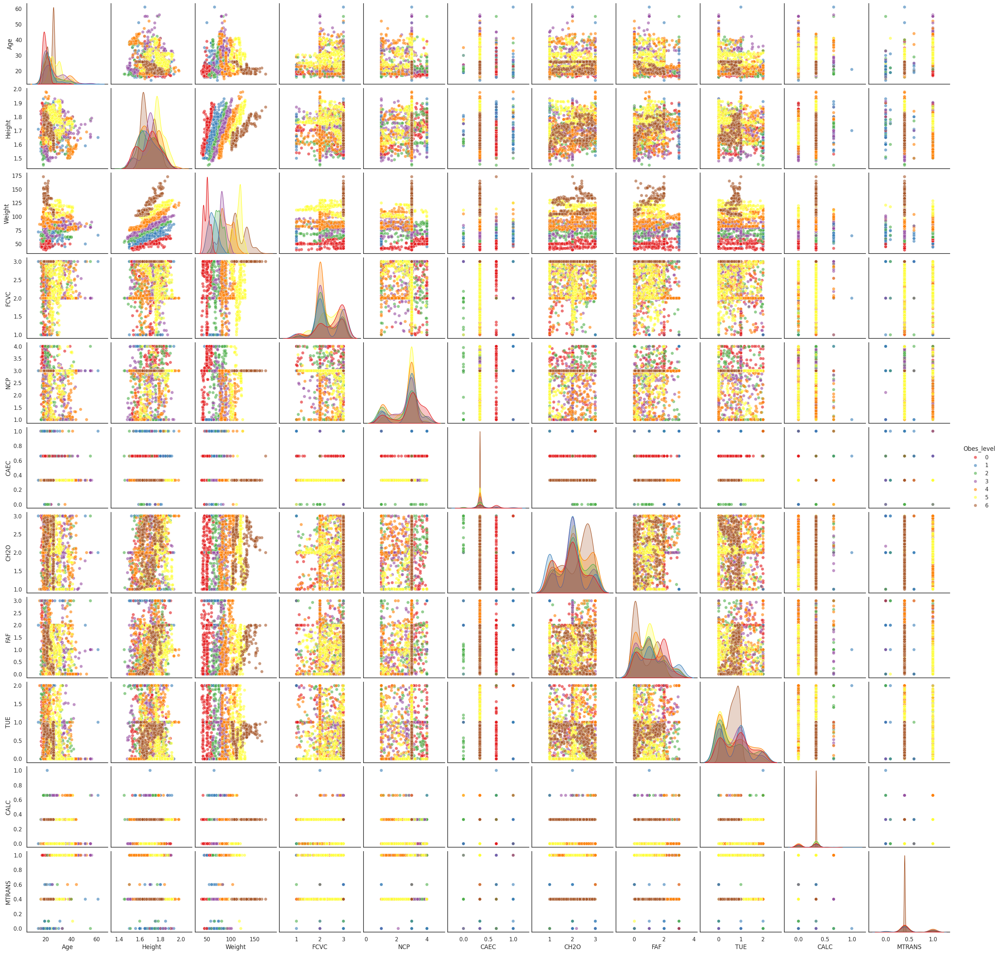

In [186]:
sns.pairplot(
    data_frame.drop(
        ['Gender', 'SMOKE', 'FAM_OW', 'SCC', 'FAVC'],
        axis=1
    ),
    hue=TARGET_VAR,
    palette="Set1",
    diag_kind="kde",
    plot_kws={"alpha": 0.6, "s": 40}
)

plt.show()

На представленій матриці попарних діаграм показано взаємозв’язки лише між числовими ознаками. Це дозволяє чіткіше побачити залежності між основними кількісними показниками без впливу бінарних змінних. По діагоналі відображені розподіли кожної ознаки, а на інших клітинках – діаграми розсіювання, які демонструють кореляції між парами змінних. Видно, що найбільш виражений зв’язок спостерігається між показниками зросту та ваги, що логічно відповідає фізіологічним закономірностям. Кольорове маркування за рівнем ожиріння підкреслює, що певні групи значень формують кластери, зокрема за показниками ваги та індексу маси тіла. Таким чином, ця діаграма наочно підтверджує, що саме кількісні характеристики роблять найбільший внесок у відмінності між рівнями ожиріння.

**Підготовка даних для тренування**

Повернемо значення "Obesity_level" назад до категоріальних.

In [189]:
mobility_map = {
    0: 'Insufficient_Weight',
    1: 'Normal_Weight',
    2: 'Overweight_Level_I',
    3: 'Overweight_Level_II',
    4: 'Obesity_Type_I',
    5: 'Obesity_Type_II',
    6: 'Obesity_Type_III'
}

data_frame['Obes_level'] = data_frame['Obes_level'].map(mobility_map)

data_frame


,Gender,Age,Height,Weight,FAM_OW,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,Obes_level
0,1.0,21.000000,1.620000,64.000000,1.0,0.0,2.0,3.0,0.33,0.0,2.000000,0.0,0.000000,1.000000,0.00,0.4,Normal_Weight
1,1.0,21.000000,1.520000,56.000000,1.0,0.0,3.0,3.0,0.33,1.0,3.000000,1.0,3.000000,0.000000,0.33,0.4,Normal_Weight
2,0.0,23.000000,1.800000,77.000000,1.0,0.0,2.0,3.0,0.33,0.0,2.000000,0.0,2.000000,1.000000,0.66,0.4,Normal_Weight
3,0.0,27.000000,1.800000,87.000000,0.0,0.0,3.0,3.0,0.33,0.0,2.000000,0.0,2.000000,0.000000,0.66,0.0,Overweight_Level_I
4,0.0,22.000000,1.780000,89.800000,0.0,0.0,2.0,1.0,0.33,0.0,2.000000,0.0,0.000000,0.000000,0.33,0.4,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,1.0,20.976842,1.710730,131.408528,1.0,1.0,3.0,3.0,0.33,0.0,1.728139,0.0,1.676269,0.906247,0.33,0.4,Obesity_Type_III
2107,1.0,21.982942,1.748584,133.742943,1.0,1.0,3.0,3.0,0.33,0.0,2.005130,0.0,1.341390,0.599270,0.33,0.4,Obesity_Type_III
2108,1.0,22.524036,1.752206,133.689352,1.0,1.0,3.0,3.0,0.33,0.0,2.054193,0.0,1.414209,0.646288,0.33,0.4,Obesity_Type_III
2109,1.0,24.361936,1.739450,133.346641,1.0,1.0,3.0,3.0,0.33,0.0,2.852339,0.0,1.139107,0.586035,0.33,0.4,Obesity_Type_III


Розібʼємо набір даних на навчальний (75%) і тестовий (25%)

In [190]:
from sklearn.model_selection import train_test_split

In [192]:
X = data_frame.drop(columns=['Obes_level'])
y = data_frame['Obes_level']


In [195]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.25,
    random_state=42,
    stratify=y
)

In [198]:
print("Train:")
display(pd.concat([X_train, y_train], axis=1).head())

print("Test:")
display(pd.concat([X_test, y_test], axis=1).head())


Train:


,Gender,Age,Height,Weight,FAM_OW,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,Obes_level
1007,0.0,22.943130,1.819614,93.086419,1.0,1.0,1.882235,1.240046,0.33,0.0,2.000000,0.0,0.000000,1.541493,0.33,0.4,Overweight_Level_II
822,1.0,21.938831,1.611239,67.939653,1.0,1.0,1.906194,3.987707,0.33,0.0,2.597746,0.0,1.922234,1.376124,0.33,0.4,Overweight_Level_I
688,0.0,17.729923,1.732862,51.216463,0.0,1.0,2.051283,2.645858,0.33,0.0,2.357520,0.0,0.291309,0.897942,0.33,0.4,Insufficient_Weight
836,1.0,31.255587,1.693080,71.927379,1.0,1.0,2.615788,3.000000,0.33,0.0,1.771781,0.0,0.759422,0.686529,0.33,1.0,Overweight_Level_I
811,0.0,19.741202,1.816783,86.522799,1.0,1.0,2.000000,3.000000,0.33,0.0,2.177386,0.0,0.336814,0.004813,0.33,0.4,Overweight_Level_I


Test:


,Gender,Age,Height,Weight,FAM_OW,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,Obes_level
77,1.0,24.000000,1.700000,80.000000,1.0,1.0,2.000000,3.0,0.33,0.0,3.000000,0.0,0.000000,0.000000,0.00,0.4,Overweight_Level_II
1748,0.0,29.891473,1.760030,112.409191,1.0,1.0,2.262292,3.0,0.33,0.0,2.115354,0.0,0.000000,0.847587,0.33,1.0,Obesity_Type_II
477,1.0,18.000000,1.640000,56.000000,1.0,1.0,3.000000,3.0,0.66,0.0,1.000000,1.0,1.000000,1.000000,0.00,0.4,Normal_Weight
1873,1.0,23.761970,1.691350,114.480696,1.0,1.0,3.000000,3.0,0.33,0.0,2.509535,0.0,0.334264,0.668172,0.33,0.4,Obesity_Type_III
1390,1.0,22.676243,1.620938,82.283185,1.0,1.0,1.967061,1.0,0.33,0.0,2.548651,0.0,0.249264,1.516731,0.33,0.4,Obesity_Type_I


Нормалізація значень

Зведемо значення до відрізку [0,1]

In [199]:
min_vals = X_train.min()
max_vals = X_train.max()


X_train = (X_train - min_vals) / (max_vals - min_vals)
X_test = (X_test - min_vals) / (max_vals - min_vals)


In [201]:
print("Train:")
display(pd.concat([X_train, y_train], axis=1).head())

print("Test:")
display(pd.concat([X_test, y_test], axis=1).head())

Train:


,Gender,Age,Height,Weight,FAM_OW,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,Obes_level
1007,0.0,0.172677,0.693718,0.444646,1.0,1.0,0.441118,0.080015,0.33,0.0,0.500000,0.0,0.000000,0.770747,0.33,0.4,Overweight_Level_II
822,1.0,0.150844,0.295793,0.237913,1.0,1.0,0.453097,0.995902,0.33,0.0,0.798873,0.0,0.640745,0.688062,0.33,0.4,Overweight_Level_I
688,0.0,0.059346,0.528051,0.100432,0.0,1.0,0.525642,0.548619,0.33,0.0,0.678760,0.0,0.097103,0.448971,0.33,0.4,Insufficient_Weight
836,1.0,0.353382,0.452081,0.270697,1.0,1.0,0.807894,0.666667,0.33,0.0,0.385891,0.0,0.253141,0.343264,0.33,1.0,Overweight_Level_I
811,0.0,0.103070,0.688311,0.390686,1.0,1.0,0.500000,0.666667,0.33,0.0,0.588693,0.0,0.112271,0.002406,0.33,0.4,Overweight_Level_I


Test:


,Gender,Age,Height,Weight,FAM_OW,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,Obes_level
77,1.0,0.195652,0.465296,0.337062,1.0,1.0,0.500000,0.666667,0.33,0.0,1.000000,0.0,0.000000,0.000000,0.00,0.4,Overweight_Level_II
1748,0.0,0.323728,0.579933,0.603498,1.0,1.0,0.631146,0.666667,0.33,0.0,0.557677,0.0,0.000000,0.423793,0.33,1.0,Obesity_Type_II
477,1.0,0.065217,0.350716,0.139757,1.0,1.0,1.000000,0.666667,0.66,0.0,0.000000,1.0,0.333333,0.500000,0.00,0.4,Normal_Weight
1873,1.0,0.190478,0.448777,0.620528,1.0,1.0,1.000000,0.666667,0.33,0.0,0.754768,0.0,0.111421,0.334086,0.33,0.4,Obesity_Type_III
1390,1.0,0.166875,0.314314,0.355832,1.0,1.0,0.483530,0.000000,0.33,0.0,0.774325,0.0,0.083088,0.758366,0.33,0.4,Obesity_Type_I


**Модель kNN (k Nearest Neighbors)**

Шляхом підбору параметрів було з'ясовано, що в якості ваги найкраще буде використати 'distance', а метрику взяти з L_2


In [205]:
from sklearn.neighbors import KNeighborsClassifier

In [206]:
max_k = 40
p_value = 2
weight_type = "distance"

Обираємо значення k так, щоб мінімізувати помилку

In [207]:
error_rates = []

for k in range(1, max_k):
    knn_model = KNeighborsClassifier(
        n_neighbors=k,
        p=p_value,
        weights=weight_type
    )
    knn_model.fit(X_train, y_train)
    y_pred = knn_model.predict(X_test)
    error = np.mean(y_pred != y_test)
    error_rates.append(error)

optimal_k = np.argmin(error_rates) + 1


In [208]:
print(error_rates)

[np.float64(0.1590909090909091), np.float64(0.1590909090909091), np.float64(0.17992424242424243), np.float64(0.18181818181818182), np.float64(0.17803030303030304), np.float64(0.1875), np.float64(0.1875), np.float64(0.1875), np.float64(0.1893939393939394), np.float64(0.1875), np.float64(0.19128787878787878), np.float64(0.19696969696969696), np.float64(0.19696969696969696), np.float64(0.19318181818181818), np.float64(0.19507575757575757), np.float64(0.20265151515151514), np.float64(0.20454545454545456), np.float64(0.20643939393939395), np.float64(0.21401515151515152), np.float64(0.2159090909090909), np.float64(0.2215909090909091), np.float64(0.2196969696969697), np.float64(0.22727272727272727), np.float64(0.22537878787878787), np.float64(0.2215909090909091), np.float64(0.23295454545454544), np.float64(0.23295454545454544), np.float64(0.23674242424242425), np.float64(0.24242424242424243), np.float64(0.25), np.float64(0.2518939393939394), np.float64(0.25), np.float64(0.25757575757575757), 

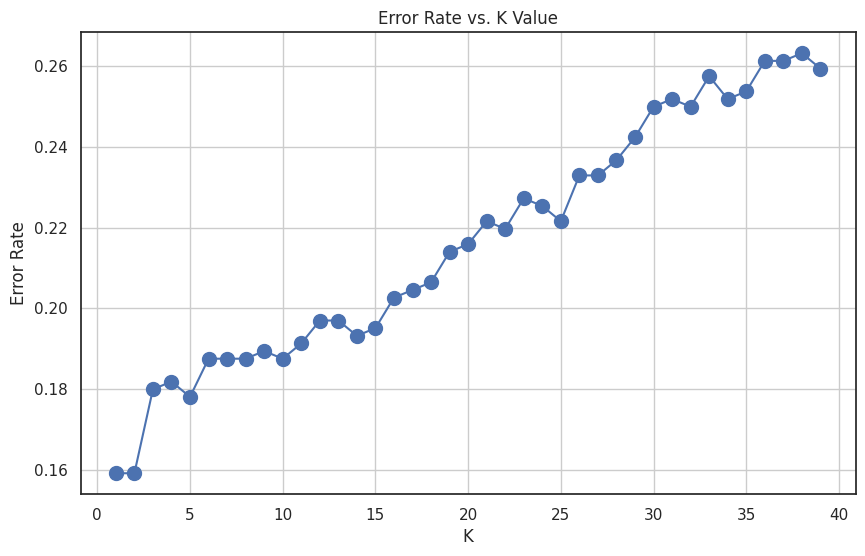

In [209]:
plt.figure(figsize=(10,6))
plt.plot(range(1, max_k), error_rates, marker='o', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
plt.grid()

In [211]:
print(f"Optimal K value is {optimal_k}")

Optimal K value is 1


На графіку бачимо, що найнижчий рівень помилки досягається при K=1. Це означає, що для класифікації достатньо лише одного найближчого сусіда. Такий результат свідчить про хорошу структурованість даних, де вже найближчий об’єкт з навчальної вибірки належить до правильного класу. Однак варто враховувати, що занадто мале значення K може призводити до перенавчання, тому в реальних задачах часто вибирають компромісне значення K.

Обчислюємо передбачення за допомогою kNN з оптимальним значенням k

In [216]:
knn_model = KNeighborsClassifier(
    n_neighbors = optimal_k,
    p = p_value,
    weights = weight_type
)

knn_model.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=np.int64(1), weights='distance')

In [222]:
knn_pred = knn_model.predict(X_test)

In [228]:
results = pd.DataFrame({
    "Actual": y_test,
    "Predicted": knn_pred
})
print(results)


                   Actual            Predicted
77    Overweight_Level_II   Overweight_Level_I
1748      Obesity_Type_II      Obesity_Type_II
477         Normal_Weight  Overweight_Level_II
1873     Obesity_Type_III     Obesity_Type_III
1390       Obesity_Type_I       Obesity_Type_I
...                   ...                  ...
664   Insufficient_Weight  Insufficient_Weight
428         Normal_Weight        Normal_Weight
725   Insufficient_Weight  Insufficient_Weight
1987     Obesity_Type_III     Obesity_Type_III
16    Overweight_Level_II  Overweight_Level_II

[528 rows x 2 columns]


Оцінюємо точність отриманих передбачень kNN

In [229]:
print(confusion_matrix(y_test, knn_pred))
print()
print(classification_report(y_test, knn_pred))

[[62  2  0  0  0  4  0]
 [14 41  5  0  0  3  9]
 [ 0  4 79  2  0  2  1]
 [ 0  0  2 68  0  1  3]
 [ 0  0  0  0 81  0  0]
 [ 1  5  5  0  1 55  6]
 [ 2  1  2  2  2  5 58]]

                     precision    recall  f1-score   support

Insufficient_Weight       0.78      0.91      0.84        68
      Normal_Weight       0.77      0.57      0.66        72
     Obesity_Type_I       0.85      0.90      0.87        88
    Obesity_Type_II       0.94      0.92      0.93        74
   Obesity_Type_III       0.96      1.00      0.98        81
 Overweight_Level_I       0.79      0.75      0.77        73
Overweight_Level_II       0.75      0.81      0.78        72

           accuracy                           0.84       528
          macro avg       0.84      0.84      0.83       528
       weighted avg       0.84      0.84      0.84       528



Отримані результати показують, що модель kNN продемонструвала загальну точність класифікації на рівні 84%. Найкраще класифікатор розпізнає класи Obesity_Type_II та Obesity_Type_III, де значення precision, recall та f1-score перевищують 0.9, що свідчить про високу ефективність у виявленні цих категорій. Разом з тим, найбільші труднощі виникають при класифікації класу Normal_Weight, де показник f1-score становить лише 0.66. Це може бути пов’язано зі схожістю характеристик нормальної ваги з іншими рівнями ожиріння та недостатньою відмінністю ознак. Загалом, модель добре справляється із завданням.

**Модель Decision Tree**

In [230]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

Створюємо класифікатор Decision Tree, тренуємо його на навчальному наборі та обчислюємо передбачення

In [231]:
decision_tree_model = DecisionTreeClassifier(
    criterion='gini'
)

decision_tree_model.fit(X_train, y_train)

DecisionTreeClassifier()

In [227]:
decision_tree_predictions = decision_tree_model.predict(X_test)

In [232]:
results = pd.DataFrame({
    "Actual": y_test,
    "Predicted": decision_tree_predictions
})

print(results)

                   Actual            Predicted
77    Overweight_Level_II  Overweight_Level_II
1748      Obesity_Type_II      Obesity_Type_II
477         Normal_Weight        Normal_Weight
1873     Obesity_Type_III     Obesity_Type_III
1390       Obesity_Type_I       Obesity_Type_I
...                   ...                  ...
664   Insufficient_Weight  Insufficient_Weight
428         Normal_Weight   Overweight_Level_I
725   Insufficient_Weight  Insufficient_Weight
1987     Obesity_Type_III     Obesity_Type_III
16    Overweight_Level_II       Obesity_Type_I

[528 rows x 2 columns]


Оцінюємо точність отриманих передбачень Decision Tree

In [233]:
print(confusion_matrix(y_test, decision_tree_predictions))
print()
print(classification_report(y_test, decision_tree_predictions))

[[60  8  0  0  0  0  0]
 [ 1 60  0  0  0 11  0]
 [ 0  1 83  1  0  1  2]
 [ 0  0  6 68  0  0  0]
 [ 0  0  1  0 80  0  0]
 [ 0  8  0  0  0 62  3]
 [ 0  0  7  0  0  2 63]]

                     precision    recall  f1-score   support

Insufficient_Weight       0.98      0.88      0.93        68
      Normal_Weight       0.78      0.83      0.81        72
     Obesity_Type_I       0.86      0.94      0.90        88
    Obesity_Type_II       0.99      0.92      0.95        74
   Obesity_Type_III       1.00      0.99      0.99        81
 Overweight_Level_I       0.82      0.85      0.83        73
Overweight_Level_II       0.93      0.88      0.90        72

           accuracy                           0.90       528
          macro avg       0.91      0.90      0.90       528
       weighted avg       0.91      0.90      0.90       528



Модель класифікації на основі алгоритму Decision Tree показала досить високі результати. Загальна точність моделі (accuracy) становить 90%, а середні значення метрик precision, recall та f1-score знаходяться на рівні 0.90–0.91. Це свідчить про збалансовану якість моделі, оскільки вона добре справляється як з виявленням позитивних прикладів (recall), так і з правильністю прогнозів (precision). Найвищу якість класифікації модель продемонструвала для класів Obesity_Type_II та Obesity_Type_III (f1-score = 0.95 і 0.99 відповідно), що свідчить про чітке відокремлення цих категорій. Водночас дещо нижчі результати спостерігаються для класів Normal_Weight та Overweight_Level_I, де f1-score знаходиться на рівні 0.81–0.83, що може бути пов’язано з частковим перетином ознак між цими категоріями.

Дерево, використане для класифікації

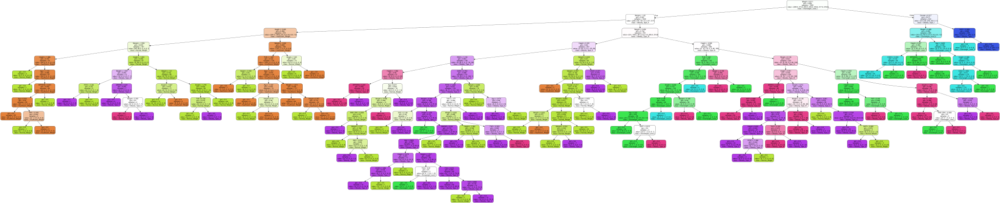

In [250]:
from sklearn.tree import export_graphviz
import graphviz

dot_data = export_graphviz(
    decision_tree_model,
    out_file=None,
    feature_names=OTHER_FEATURES,
    class_names=list(mobility_map.values()),
    filled=True,
    rounded=True,
    special_characters=True
)

graph = graphviz.Source(dot_data)
graph


Дерево рішень будує класифікацію на основі послідовних поділів даних за ознаками, що найбільше впливають на кінцевий результат. У кожному вузлі відображено: умову поділу (наприклад, Height ≤ -1.986), показник чистоти вузла (gini), кількість прикладів (samples), розподіл об’єктів по класах (value) та домінуючий клас (class).
Поділ продовжується доти, поки дані не стають однорідними або поки не досягнуто обмеження на глибину дерева.
У кінцевих (листових) вузлах (gini = 0.0) всі приклади належать до одного класу, що означає однозначну класифікацію. Таким чином, дерево поступово уточнює прогноз, відкидаючи менш імовірні варіанти й залишаючи найбільш характерні ознаки для визначення категорії ваги.

**Модель SVM (Support Vector Machine)**

In [251]:
from sklearn.svm import SVC

Підбираємо найкращі параметри за допомогою Grid Search та навчаємо на тренувальних даних

In [252]:
from sklearn.model_selection import GridSearchCV

In [253]:
param_grid = {
    "C": [0.1, 1, 10, 100, 1000],
    "gamma": [1, 0.1, 0.01, 0.001, 0.0001],
    "kernel": ["rbf"]
}

svm_model = SVC()

grid_search = GridSearchCV(estimator=svm_model,
                           param_grid=param_grid,
                           refit=True)

grid_search.fit(X_train, y_train)


GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']})

Отримані параметри

In [254]:
print(grid_search.best_params_)

{'C': 1000, 'gamma': 0.001, 'kernel': 'rbf'}


In [255]:
print(grid_search.best_estimator_)

SVC(C=1000, gamma=0.001)


Обчислюємо передбачення

In [256]:
svc_pred = grid_search.predict(X_test)

In [259]:
results = pd.DataFrame({
    "Actual": y_test,
    "Predicted": svc_pred

})

print(results)

                   Actual            Predicted
77    Overweight_Level_II  Overweight_Level_II
1748      Obesity_Type_II      Obesity_Type_II
477         Normal_Weight        Normal_Weight
1873     Obesity_Type_III     Obesity_Type_III
1390       Obesity_Type_I       Obesity_Type_I
...                   ...                  ...
664   Insufficient_Weight  Insufficient_Weight
428         Normal_Weight        Normal_Weight
725   Insufficient_Weight  Insufficient_Weight
1987     Obesity_Type_III     Obesity_Type_III
16    Overweight_Level_II  Overweight_Level_II

[528 rows x 2 columns]


Оцінюємо точність отриманих передбачень SVM

In [260]:
print(confusion_matrix(y_test, svc_pred))
print()
print(classification_report(y_test, svc_pred))

[[68  0  0  0  0  0  0]
 [ 2 65  0  0  0  5  0]
 [ 0  0 85  0  0  0  3]
 [ 0  0  0 74  0  0  0]
 [ 0  0  0  1 80  0  0]
 [ 0  3  0  0  0 68  2]
 [ 0  0  2  0  0  1 69]]

                     precision    recall  f1-score   support

Insufficient_Weight       0.97      1.00      0.99        68
      Normal_Weight       0.96      0.90      0.93        72
     Obesity_Type_I       0.98      0.97      0.97        88
    Obesity_Type_II       0.99      1.00      0.99        74
   Obesity_Type_III       1.00      0.99      0.99        81
 Overweight_Level_I       0.92      0.93      0.93        73
Overweight_Level_II       0.93      0.96      0.95        72

           accuracy                           0.96       528
          macro avg       0.96      0.96      0.96       528
       weighted avg       0.96      0.96      0.96       528



Модель класифікації на основі алгоритму Support Vector Machine (SVM) продемонструвала високі результати. Загальна точність моделі (accuracy) становить 96%, а середні значення метрик precision, recall та f1-score перебувають на рівні 0.96. Це свідчить про стабільну та збалансовану якість класифікації, оскільки модель добре справляється як із виявленням прикладів різних класів (recall), так і з правильністю прогнозів (precision). Найвищі показники спостерігаються для класів Obesity_Type_III та Insufficient_Weight (f1-score = 0.99), що свідчить про чітке розділення цих категорій. Водночас дещо нижчі результати отримано для класів Normal_Weight та Overweight_Level_I, де f1-score знаходиться на рівні 0.93, що може пояснюватися схожістю ознак між цими групами.

**Модель Random Forest**

In [261]:
from sklearn.ensemble import RandomForestClassifier

Тренуємо модель Random Forest та обчислюємо передбачення

Стандартні параметри моделі дають достатньо хороший класифікатор та не викликають проблем із обчислювальними потужностями.

In [262]:
random_forest_model = RandomForestClassifier()
random_forest_model.fit(X_train, y_train)

RandomForestClassifier()

In [263]:
rf_predictions = random_forest_model.predict(X_test)

In [264]:
results = pd.DataFrame({
    "Actual": y_test,
    "Predicted": rf_predictions

})

print(results)

                   Actual            Predicted
77    Overweight_Level_II  Overweight_Level_II
1748      Obesity_Type_II      Obesity_Type_II
477         Normal_Weight        Normal_Weight
1873     Obesity_Type_III     Obesity_Type_III
1390       Obesity_Type_I       Obesity_Type_I
...                   ...                  ...
664   Insufficient_Weight  Insufficient_Weight
428         Normal_Weight        Normal_Weight
725   Insufficient_Weight  Insufficient_Weight
1987     Obesity_Type_III     Obesity_Type_III
16    Overweight_Level_II       Obesity_Type_I

[528 rows x 2 columns]


Оцінюємо точність отриманих передбачень Random Forest

In [265]:
print(confusion_matrix(y_test, rf_predictions))
print()
print(classification_report(y_test, rf_predictions))

[[64  4  0  0  0  0  0]
 [ 0 70  0  0  0  2  0]
 [ 0  2 85  0  0  0  1]
 [ 0  0  1 73  0  0  0]
 [ 0  0  0  1 80  0  0]
 [ 0  9  1  0  0 63  0]
 [ 0  4  2  0  0  1 65]]

                     precision    recall  f1-score   support

Insufficient_Weight       1.00      0.94      0.97        68
      Normal_Weight       0.79      0.97      0.87        72
     Obesity_Type_I       0.96      0.97      0.96        88
    Obesity_Type_II       0.99      0.99      0.99        74
   Obesity_Type_III       1.00      0.99      0.99        81
 Overweight_Level_I       0.95      0.86      0.91        73
Overweight_Level_II       0.98      0.90      0.94        72

           accuracy                           0.95       528
          macro avg       0.95      0.95      0.95       528
       weighted avg       0.95      0.95      0.95       528



Модель класифікації на основі алгоритму Random Forest продемонструвала високу ефективність. Загальна точність (accuracy) становить 95%, а середні значення метрик precision, recall та f1-score перебувають на рівні 0.95. Це свідчить про стабільну та збалансовану роботу моделі. Найкращі результати отримано для класів Obesity_Type_II та Obesity_Type_III, де значення f1-score сягають 0.99, що підтверджує чітке розмежування цих категорій. Також дуже високі показники спостерігаються для класів Obesity_Type_I та Overweight_Level_II (f1-score = 0.96 та 0.94 відповідно). Водночас дещо нижчі результати спостерігаються для класів Normal_Weight (f1-score = 0.87) та Overweight_Level_I (f1-score = 0.91). Це може бути пов’язано з тим, що їхні ознаки частково перетинаються з іншими групами, що ускладнює коректну класифікацію.

**Модель AdaBoost**

In [266]:
from sklearn.ensemble import AdaBoostClassifier

Тренуємо модель AdaBoost використовуючи стандартний алгоритм та обчислюємо передбачення

In [272]:
ada_boost_model = AdaBoostClassifier(algorithm='SAMME')
ada_boost_model.fit(X_train, y_train)

/usr/local/lib/python3.12/dist-packages/sklearn/ensemble/_weight_boosting.py:519: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.


AdaBoostClassifier(algorithm='SAMME')

In [268]:
ab_predictions = ada_boost_model.predict(X_test)

In [269]:
results = pd.DataFrame({
    "Actual": y_test,
    "Predicted": ab_predictions

})

print(results)

                   Actual            Predicted
77    Overweight_Level_II  Overweight_Level_II
1748      Obesity_Type_II       Obesity_Type_I
477         Normal_Weight  Insufficient_Weight
1873     Obesity_Type_III       Obesity_Type_I
1390       Obesity_Type_I  Overweight_Level_II
...                   ...                  ...
664   Insufficient_Weight  Insufficient_Weight
428         Normal_Weight   Overweight_Level_I
725   Insufficient_Weight  Insufficient_Weight
1987     Obesity_Type_III       Obesity_Type_I
16    Overweight_Level_II       Obesity_Type_I

[528 rows x 2 columns]


Оцінюємо точність отриманих передбачень Random Forest

In [270]:
print(confusion_matrix(y_test, ab_predictions))
print()
print(classification_report(y_test, ab_predictions))

[[51 14  0  0  0  3  0]
 [26 16  0  0  0 27  3]
 [ 0  0 46  0  0  2 40]
 [ 0  0 74  0  0  0  0]
 [ 0  0 81  0  0  0  0]
 [ 2  5  0  0  0 43 23]
 [ 0  0 13  0  0  8 51]]

                     precision    recall  f1-score   support

Insufficient_Weight       0.65      0.75      0.69        68
      Normal_Weight       0.46      0.22      0.30        72
     Obesity_Type_I       0.21      0.52      0.30        88
    Obesity_Type_II       0.00      0.00      0.00        74
   Obesity_Type_III       0.00      0.00      0.00        81
 Overweight_Level_I       0.52      0.59      0.55        73
Overweight_Level_II       0.44      0.71      0.54        72

           accuracy                           0.39       528
          macro avg       0.32      0.40      0.34       528
       weighted avg       0.31      0.39      0.33       528



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.


Модель класифікації на основі алгоритму AdaBoost (SAMME) показала низьку ефективність. Загальна точність (accuracy) становить лише 39%, а середні значення метрик precision, recall та f1-score знаходяться на рівні приблизно 0.31–0.40. Це свідчить про нестабільну роботу моделі та суттєві труднощі з розмежуванням класів. Найкращі результати спостерігаються для класів Insufficient_Weight та частково Overweight_Level_I/II (f1-score ≈ 0.69, 0.55 та 0.54 відповідно). Водночас модель практично не розпізнає категорії Obesity_Type_II та Obesity_Type_III (f1-score = 0.00), а також демонструє низьку якість для Normal_Weight та Obesity_Type_I (f1-score ≈ 0.30). Ймовірна причина — занадто слабкі базові оцінювачі та використання дискретного варіанту бустингу SAMME для складної багатокласової задачі.

**Фінальне порівняння точності та висновки**

In [273]:
print("Results for different Classificators:")
print(f"kNN:\t\t{accuracy_score(y_test, knn_pred)}")
print(f"Decision Tree:\t{accuracy_score(y_test, decision_tree_predictions)}")
print(f"SVM:\t\t{accuracy_score(y_test, svc_pred)}")
print(f"Random Forest:\t{accuracy_score(y_test, rf_predictions)}")
print(f"AdaBoost:\t{accuracy_score(y_test, ab_predictions)}")

Results for different Classificators:
kNN:		0.8409090909090909
Decision Tree:	0.9015151515151515
SVM:		0.9640151515151515
Random Forest:	0.946969696969697
AdaBoost:	0.39204545454545453


Фінальне порівняння точності різних класифікаторів показало суттєву різницю в їхній ефективності. Найвищу точність продемонстрував алгоритм SVM (96%), який виявився найстабільнішим та найточнішим серед усіх методів. Дуже близькі результати показала й модель Random Forest (95%), що підтверджує її здатність добре працювати з даними складної структури. Алгоритм kNN досяг прийнятного рівня точності (84%), проте значно поступається лідерам. Значно гірше себе проявив AdaBoost (39%), що свідчить про його низьку здатність до якісної класифікації даного набору даних, ймовірно, через недостатню кількість слабких моделей або особливості даних.

**ВИСНОВОК:** В ході виконання лабораторної роботи було отримано практичні навички роботи з датасетами, побудови класифікаторів та оцінки їхньої ефективності. Серед усіх побудованих моделей найкраще себе показав алгоритм SVM, який продемонстрував найвищу точність. Дуже близькі результати отримано й для Random Forest, що підтверджує його високу ефективність для даного завдання. Алгоритм kNN показав середній рівень якості, значно поступаючись лідерам. Натомість AdaBoost виявився малоефективним, що може бути пов’язано з невдалим підбором параметрів або особливостями використаного датасета. Таким чином, для цього завдання найкраще підходять SVM та Random Forest.